# Synthesizing Images of Normal using WGAN-Gradient Penalty- Scheme2(292)-WGAN-Dataset

Scheme2-Dataset (Cohen) is comprised of two classes i.e.'COVID19', 'PNEUMONIA'

In [1]:
import os
import seaborn as sns
import pandas as pd
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms as tt, datasets
from torchvision.transforms import ToTensor, Normalize, Compose, Resize
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from IPython.display import Image
from torchvision.utils import save_image
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline
matplotlib.rcParams['figure.facecolor'] = '#ffffff'

# Set Seaborn style.

In [ ]:
%matplotlib inline
sns.set_style('darkgrid')

In [2]:
data_dir ='./Scheme2(292)-Normal-WGAN-Dataset'

print(os.listdir(data_dir))
classes = os.listdir(data_dir + '/train')
print(classes)

['test', 'train']
['NORMAL']


In [3]:
covid19_files = os.listdir(data_dir + "/train/NORMAL")
print('No. of training examples for Covid19:', len(covid19_files))
print(covid19_files[:5])

No. of training examples for Covid19: 146
['Normal-1.png', 'Normal-10.png', 'Normal-100.png', 'Normal-101.png', 'Normal-102.png']


# Preparing Dataset

In [4]:
train_dataset = ImageFolder(data_dir+'/train', transform=tt.Compose
                      ([tt.ToTensor(), 
                        tt.Grayscale(num_output_channels=1), 
                        tt.Resize((128,128)), 
                        tt.Normalize(mean=(0.5,), std=(0.5,))
                        
                       ]
                      ))

In [5]:
len(train_dataset)

146

In [6]:
img, label = train_dataset[67]
print('Label: ', label)
print('Image Shape: ',img.shape)
print(img[:,10:15,10:15])

torch.min(img), torch.max(img)


Label:  0
Image Shape:  torch.Size([1, 128, 128])
tensor([[[-0.1619, -0.1826, -0.1953, -0.1846, -0.1569],
         [-0.2075, -0.1905, -0.2079, -0.1982, -0.1696],
         [-0.1887, -0.1322, -0.1194, -0.1149, -0.1037],
         [-0.2437, -0.0716, -0.0056,  0.0212, -0.0296],
         [-0.0868, -0.0153,  0.0844,  0.1250,  0.1612]]])


(tensor(-1.), tensor(0.9256))

In [7]:
def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)

Label: 0


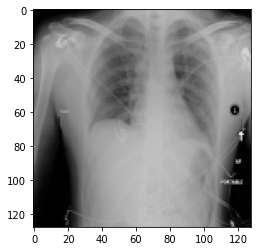

In [8]:
img_norm = denorm(img)
plt.imshow(img_norm[0], cmap='gray')
print('Label:', label)

In [9]:
batch_size = 20
data_loader= DataLoader(train_dataset, batch_size, shuffle=True, num_workers=0, pin_memory=True)

FIRST BATCH
torch.Size([20, 1, 128, 128])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])


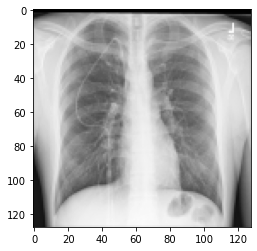

In [10]:
for img_batch, label_batch in data_loader:
    print('FIRST BATCH')
    print(img_batch.shape)
    plt.imshow(img_batch[10][0], cmap='gray')
    print(label_batch)
    break

In [11]:
def show_images(images, nmax=50):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=10).permute(1, 2, 0))

def show_batch(dl, nmax=50):
    for images, _ in dl:
        show_images(images, nmax)
        break

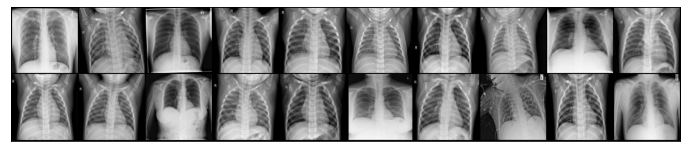

In [12]:
show_batch(data_loader)

In [13]:
print(train_dataset.class_to_idx)

{'NORMAL': 0}


# Denormalized Images


In [ ]:
def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 1, 1, 1)
    stds = torch.tensor(stds).reshape(1, 1, 1, 1)
    return images * stds + means

def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(images, 0.5157,0.2546)
        ax.imshow(make_grid(denorm_images[:64], nrow=10).permute(1, 2, 0).clamp(0,1))
        break

In [ ]:
show_batch(data_loader)

# Classes Distribution in dataset

In [ ]:
idx2class = {v: k for k, v in train_dataset.class_to_idx.items()}

def get_class_distribution(dataset_obj):
    count_dict = {k:0 for k,v in dataset_obj.class_to_idx.items()}
    for _, label_id in dataset_obj:
        label = idx2class[label_id]
        count_dict[label] += 1
    return count_dict

def plot_from_dict(dict_obj, plot_title, **kwargs):
    return sns.barplot(data = pd.DataFrame.from_dict([dict_obj]).melt(), x = "variable", y="value", hue="variable", **kwargs).set_title(plot_title)

plt.figure(figsize=(15,8))
plot_from_dict(get_class_distribution(train_dataset), plot_title="Entire Dataset (before train/val/test split)")


In [13]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [14]:
device = get_default_device()
device

device(type='cuda')

In [15]:
def show_tensor_images(image_tensor, num_images=25, size=(1,128,128)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [16]:
def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

# Generator

In [ ]:
torch.cuda.empty_cache()

In [ ]:
# To debug Code
class PrintBlock(nn.Module):
    def forward(self, x):
        print(x.shape)
        return x

In [17]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=128, im_chan=1, hidden_dim=512):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            #PrintBlock(), # [50, 100, 1, 1]
            self.make_gen_block(z_dim, hidden_dim * 2, kernel_size=4, stride=1, padding = 0),
            #PrintBlock(), # ([20, 1024, 4, 4])
            self.make_gen_block(hidden_dim * 2, hidden_dim , kernel_size=4, stride=2, padding = 1),
            #PrintBlock(), # ([20, 512, 8, 8])
            self.make_gen_block(hidden_dim, hidden_dim, kernel_size=4, stride=2, padding = 1),
            #PrintBlock(), # ([20, 512, 16, 16])
            self.make_gen_block(hidden_dim, hidden_dim // 2, kernel_size=4, stride=2, padding = 1),
            #PrintBlock(), # ([20, 256, 32, 32])
            self.make_gen_block(hidden_dim // 2, hidden_dim // 4,kernel_size=4, stride=2, padding = 1),
            #PrintBlock(), # ([20, 128, 64, 64])
            self.make_gen_block(hidden_dim // 4, im_chan,kernel_size=4, stride=2, padding =1, final_layer=True),
            #PrintBlock(), # ([20, 1, 128, 128])
            
            
            
            
          
        )
        
        

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, padding=0, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

In [ ]:
net = Generator()
out = net.forward(torch.rand([20,128]))

## Get Noise

In [18]:
def get_noise(n_samples, z_dim, device=device):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

# Critic

In [ ]:
# To debug Code
class PrintBlock(nn.Module):
    def forward(self, x):
        print(x.shape)
        return x

In [19]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (Dataset is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=128):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            #PrintBlock(), # ([20, 1, 128, 128])
            self.make_crit_block(im_chan, hidden_dim, kernel_size=4, stride=2, padding=1),
            #PrintBlock(), # ([20, 128, 64, 64])
            self.make_crit_block(hidden_dim, hidden_dim * 2, kernel_size=4, stride=2, padding=1),
            #PrintBlock(), # ([20, 256, 32, 32])
            self.make_crit_block(hidden_dim * 2, hidden_dim * 4, kernel_size=4, stride=2, padding=1),
            #PrintBlock(), # ([20, 512, 16, 16])
            self.make_crit_block(hidden_dim * 4, hidden_dim * 4,kernel_size=4, stride=2, padding=1),
            #PrintBlock(), # ([20, 512, 8, 8])
            self.make_crit_block(hidden_dim * 4, hidden_dim * 8,kernel_size=4, stride=2, padding =1),
            #PrintBlock(), # ([20, 1024, 4, 4])
            self.make_crit_block(hidden_dim * 8, 1 ,kernel_size=4, stride=1, padding = 0,final_layer=True),
            #PrintBlock(), # ([20, 1, 1, 1])         
            
        )
        
         

    def make_crit_block(self, input_channels, output_channels, kernel_size=3, stride=2, padding=0, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

In [ ]:
net = Critic()
out = net.forward(torch.rand([20, 1, 128, 128]))

# Training Initializations
Now you can start putting it all together. As usual, you will start by setting the parameters:

n_epochs: the number of times you iterate through the entire dataset when training

z_dim: the dimension of the noise vector

display_step: how often to display/visualize the images

batch_size: the number of images per forward/backward pass

lr: the learning rate

beta_1, beta_2: the momentum terms

c_lambda: weight of the gradient penalty

crit_repeats: number of times to update the critic per generator update - there are more details about this in the Putting It All Together section

device: the device type

In [22]:
device

device(type='cuda')

In [20]:
n_epochs = 50
z_dim = 128
display_step = 5
batch_size = 20
gen_lr = 0.0002
cric_lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5

Then, you can initialize your generator, critic, and optimizers.

In [21]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=gen_lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=cric_lr, betas=(beta_1, beta_2))

# Initialize weights

From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. 
The weights_init function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria.
This function is applied to the models immediately after initialization.

In [22]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

The given function init_weights isn't called prior to the apply call, precisely because there are no parentheses, rather a reference to init_weights is given to apply, and only from within apply later on init_weights is called.

It gets its argument with each call within apply, and, as the documentation tells, it is called for m iterating over every submodule of (in this case) net as well as net itself, due to the method call net.apply(…).

# Gradient Penalty

Calculating the gradient penalty can be broken into two functions:
(1) compute the gradient with respect to the images and 

(2) compute the gradient penalty given the gradient.

Start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. 

Once you have the intermediate image, you can get the critic's output on the image.

Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). 

In [23]:
#compute the gradient with respect to the images
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together to set the gradient 
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In WGAN-gp, you want to calculate the gradient wrt the norm of your gradient, because you want to optimize that your norm of gradient is constant (this is the Lipschitz constraint that you apply).

With create_graph=True, we are declaring that we want to do further operations on gradients, so that the autograd engine can create a backpropable graph for operations done on gradients.

retain_graph=True declares that we will want to reuse the overall graph multiple times, so do not delete it after someone called .backward(). From looking at the code, we do not call .backward() on the same graph again, so retain_graph=True is not needed in this case.

When you changed retain_graph=None, a model mode collapse occuring is likely something that’s happening coincidentally, but the reason for the mode collapse is not because of changing retain_graph

The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

In [24]:
#compute the gradient penalty given the gradient
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - 1)**2)
    #### END CODE HERE ####
    return penalty

# Losses

Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them

In [25]:
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -1. * torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

In [26]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    #### END CODE HERE ####
    return crit_loss

# Putting It All Together
Before you put everything together, there are a few things to note.

Even on GPU, the training will run more slowly than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.

One important difference from earlier versions is that you will update the critic multiple times every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using).

WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just increases stability and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.

In [27]:
sample_dir = 'WithGrid-NORMAL-A-Scheme2(292)WGAN'
if not os.path.exists(sample_dir):
    os.makedirs(sample_dir)

In [28]:
sample_dir_1 = 'WithOutGrid-NORMAL-A-Scheme2(292)WGAN'
if not os.path.exists(sample_dir_1):
    os.makedirs(sample_dir_1)

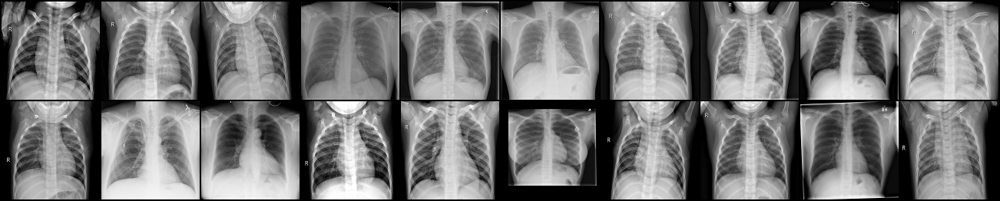

In [29]:
# Save some real images in grid and without grid
for images, _ in data_loader:
    #print(images)
    #print(torch.numel(images)) # 100 * 1 * 28 * 28
    images = images.reshape(images.size(0), 1, 128, 128)
    #save_image(denormalize(images, 0.5157,0.2546), os.path.join(sample_dir, 'real_images.png'), nrow=10)
    save_image(denorm(images), os.path.join(sample_dir, 'real_images.png'), nrow=10)
    for i in range(images.size(0)):
        #save_image(denormalize(images[i], 0.5157,0.2546), os.path.join(sample_dir_1, 'real_images'+str(i)+'.png'), nrow=10)
        save_image(denorm(images[i]), os.path.join(sample_dir_1, 'real_images'+str(i)+'.png'), nrow=10)
        
    break
   
Image(os.path.join(sample_dir, 'real_images.png'))


In [30]:
fake_noise = get_noise(batch_size, z_dim, device=device)
#fake = gen(fake_noise)

#fake.size()



Saving fake_images-0000.png


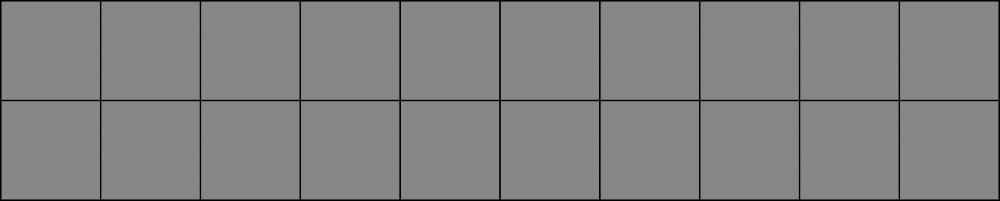

In [31]:
def save_fake_images(index):
    fake_images = gen(fake_noise)
    fake_images = fake_images.reshape(fake_images.size(0), 1, 128, 128)
    fake_fname = 'fake_images-{0:0=4d}.png'.format(index)
    print('Saving', fake_fname)
    #save_image(denormalize(fake_images, 0.5157,0.2546), os.path.join(sample_dir, fake_fname), nrow=10)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=10)
    for i in range(fake_images.size(0)):
        #save_image(denormalize(fake_images[i], 0.5157,0.2546), os.path.join(sample_dir_1, 'Epoch-'+str(index)+'-fake_images'+str(i)+'.png'), nrow=10)
        save_image(denorm(fake_images[i]), os.path.join(sample_dir_1, 'Epoch-'+str(index)+'-fake_images'+str(i)+'.png'), nrow=10)
    
# Before training
save_fake_images(0)
Image(os.path.join(sample_dir, 'fake_images-0000.png'))


# Full Training Loop

In [48]:
epoch_flag = False

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 0, step 0: Generator loss: 16.664463806152344, critic loss: -3.5891896057128903


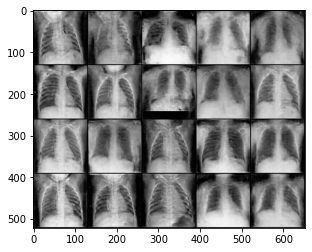

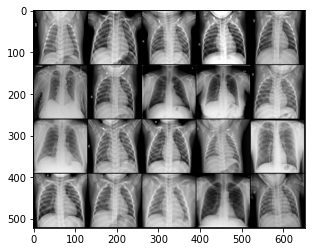

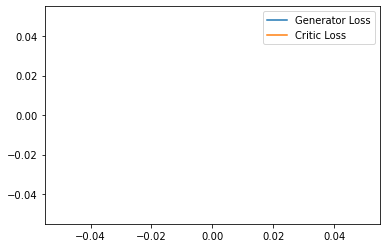

Epoch 0, step 5: Generator loss: 81.94258880615234, critic loss: -18.74468910217285


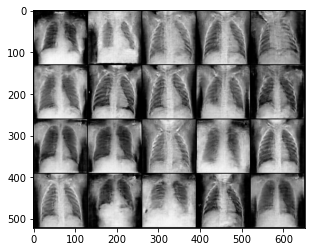

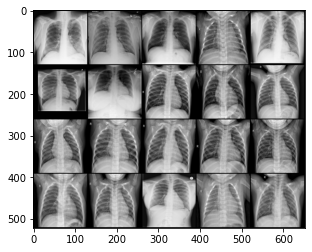

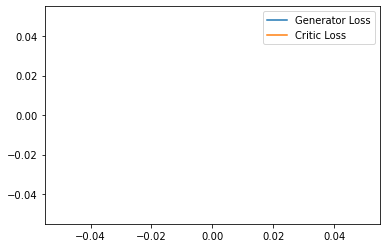

Saving fake_images-1663.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 1, step 10: Generator loss: 82.76302642822266, critic loss: -22.54269905090332


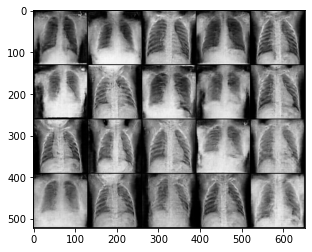

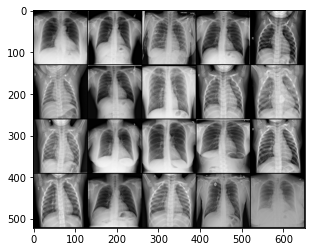

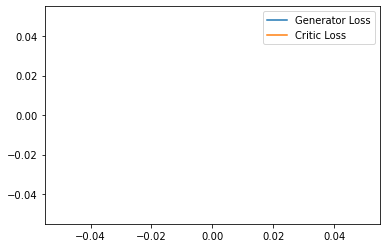

Epoch 1, step 15: Generator loss: 84.8570770263672, critic loss: -27.98565307617188


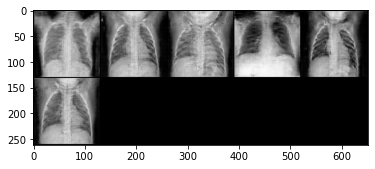

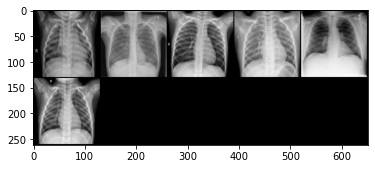

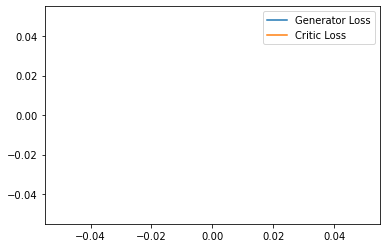

Saving fake_images-1664.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 2, step 20: Generator loss: 86.2396224975586, critic loss: -38.409934997558594


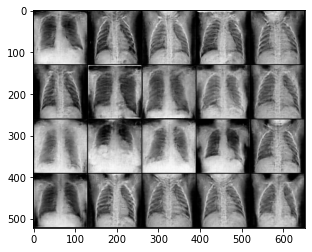

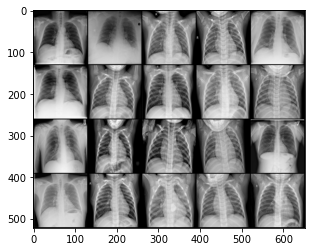

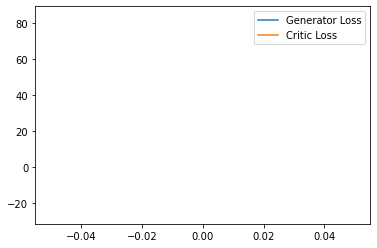

Saving fake_images-1665.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 3, step 25: Generator loss: 87.56533355712891, critic loss: -51.7946469116211


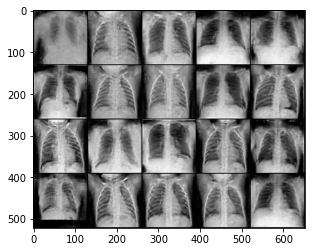

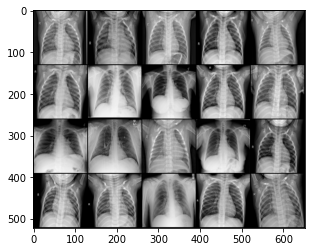

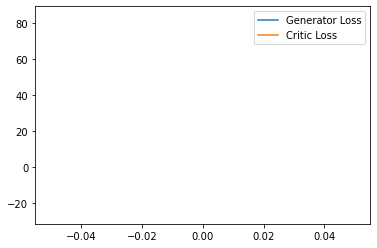

Epoch 3, step 30: Generator loss: 83.70304412841797, critic loss: -64.46408699035644


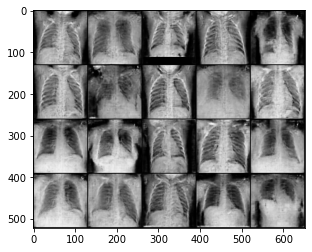

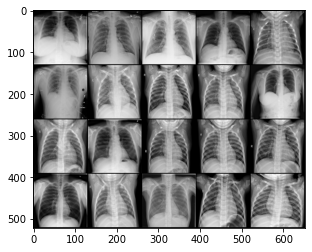

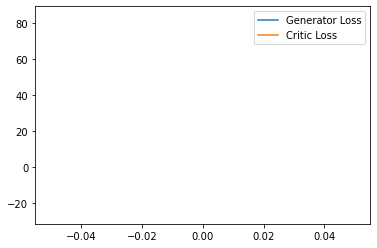

Saving fake_images-1666.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 4, step 35: Generator loss: 92.1936767578125, critic loss: -179.76666687011718


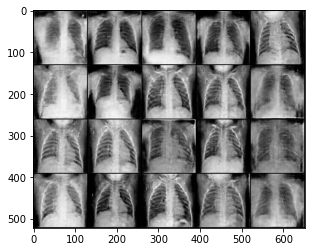

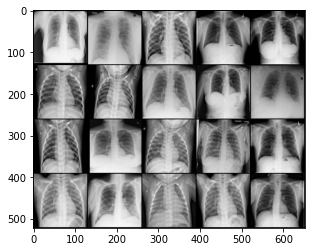

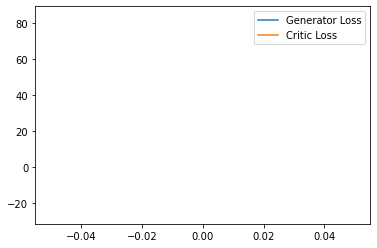

Saving fake_images-1667.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5, step 40: Generator loss: 107.79156723022462, critic loss: 96.53679244995115


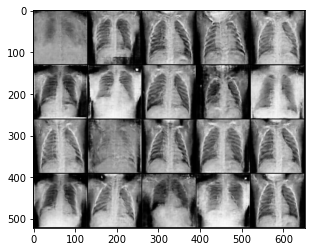

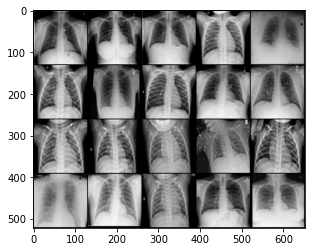

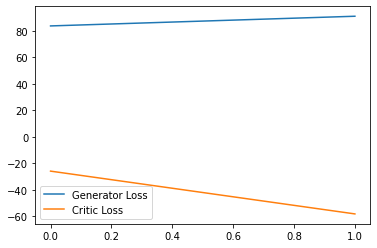

Epoch 5, step 45: Generator loss: 98.11175842285157, critic loss: 12.561311826705934


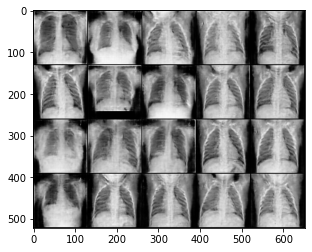

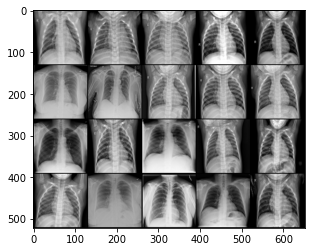

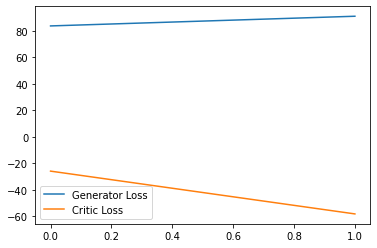

Saving fake_images-1668.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 6, step 50: Generator loss: 95.73580017089844, critic loss: 1.8960508918762204


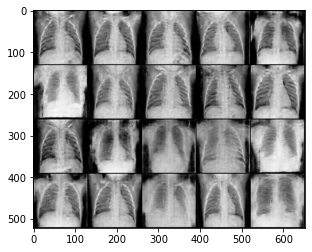

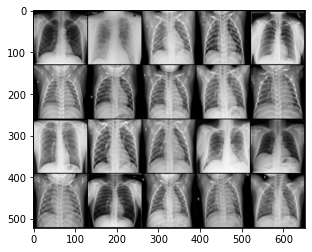

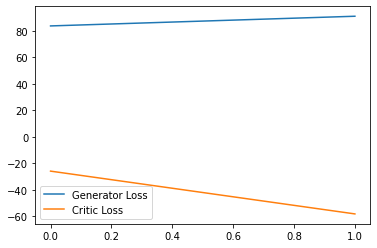

Epoch 6, step 55: Generator loss: 97.43051300048828, critic loss: -1.5247450447082518


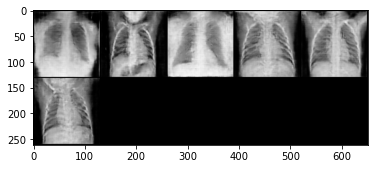

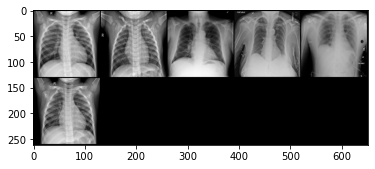

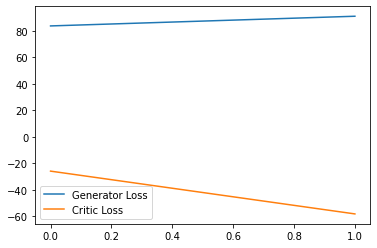

Saving fake_images-1669.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 7, step 60: Generator loss: 97.96877899169922, critic loss: -2.9426490831375127


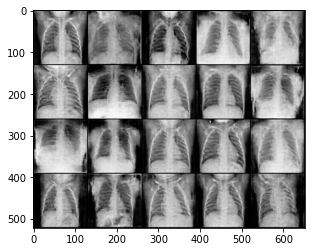

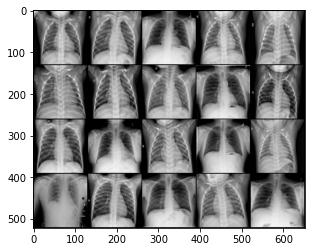

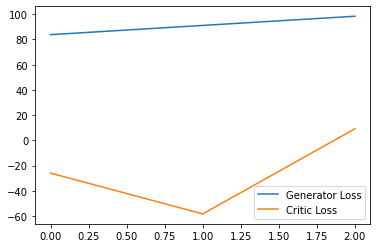

Saving fake_images-1670.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 8, step 65: Generator loss: 93.94623718261718, critic loss: -5.653179874420165


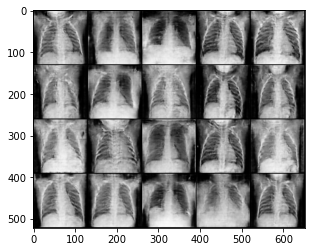

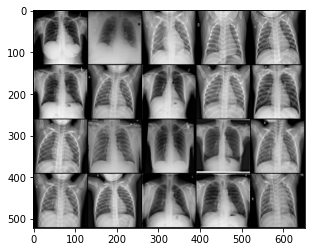

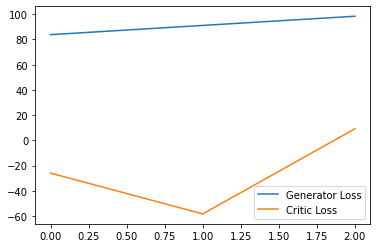

Epoch 8, step 70: Generator loss: 92.11353607177735, critic loss: -3.258252139091492


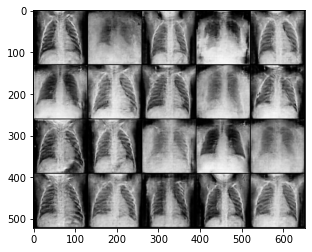

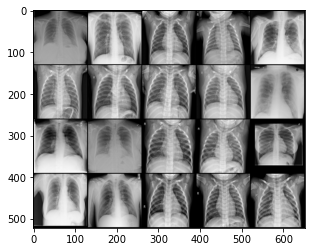

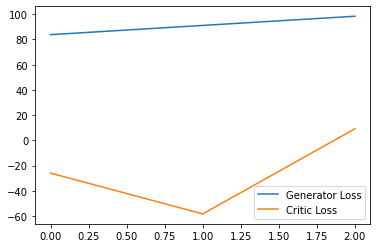

Saving fake_images-1671.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 9, step 75: Generator loss: 87.93381958007812, critic loss: -5.589365186691284


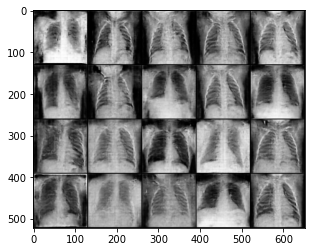

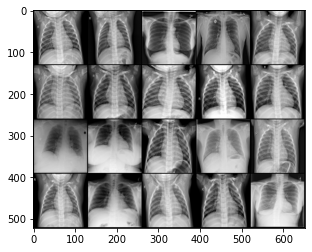

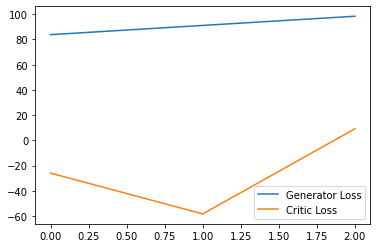

Saving fake_images-1672.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10, step 80: Generator loss: 88.85121154785156, critic loss: -3.8872561550140374


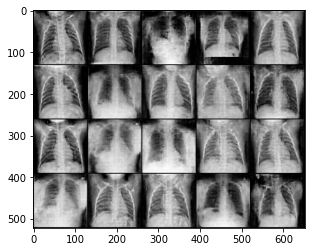

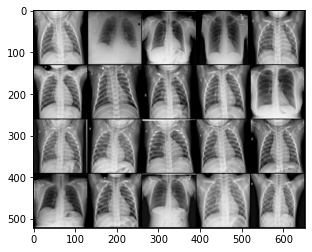

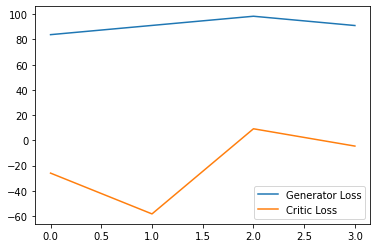

Epoch 10, step 85: Generator loss: 87.16239013671876, critic loss: -5.030863223075867


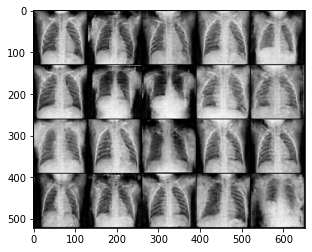

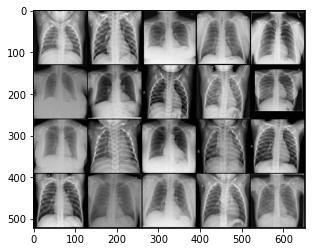

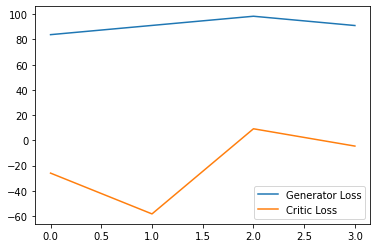

Saving fake_images-1673.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 11, step 90: Generator loss: 88.44879302978515, critic loss: -5.1302947998046875


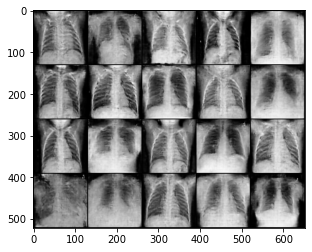

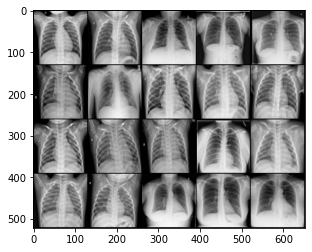

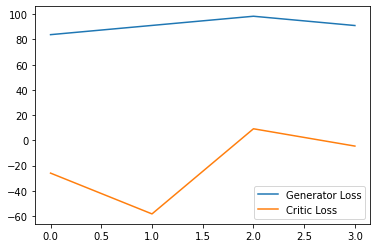

Epoch 11, step 95: Generator loss: 86.55151062011718, critic loss: -5.0590832328796385


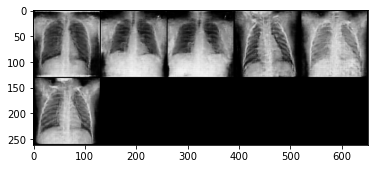

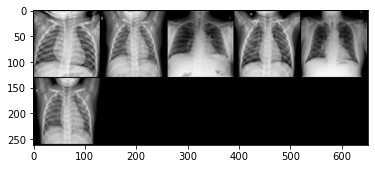

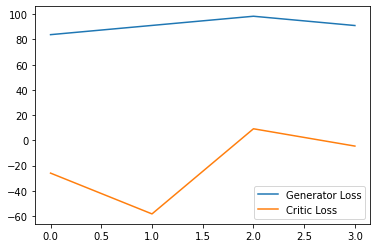

Saving fake_images-1674.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 12, step 100: Generator loss: 85.89386444091797, critic loss: -5.367826013565063


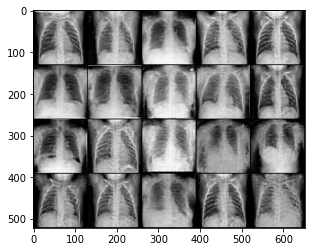

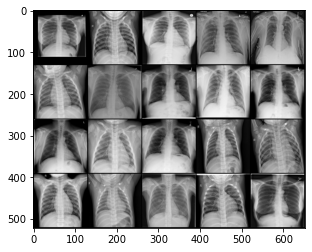

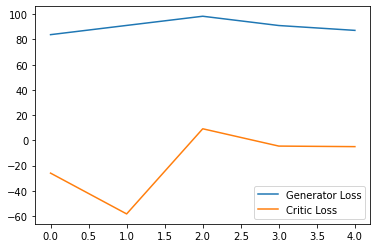

Saving fake_images-1675.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 13, step 105: Generator loss: 83.30638580322265, critic loss: -5.6616883277893075


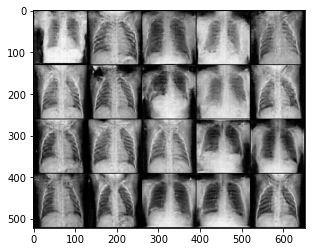

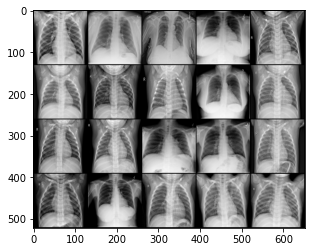

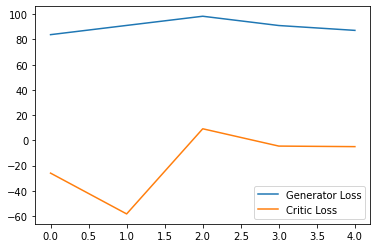

Epoch 13, step 110: Generator loss: 82.3019287109375, critic loss: -4.798175086379052


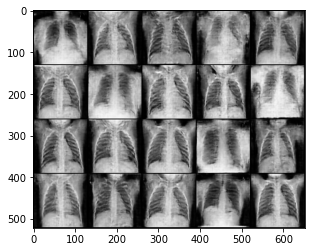

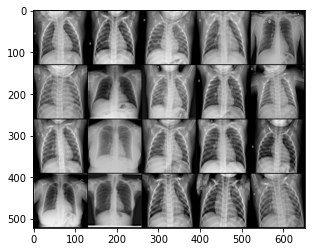

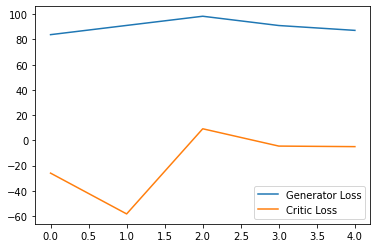

Saving fake_images-1676.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 14, step 115: Generator loss: 83.66339416503907, critic loss: -7.425806465148926


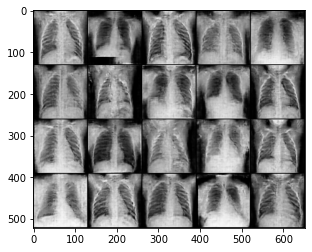

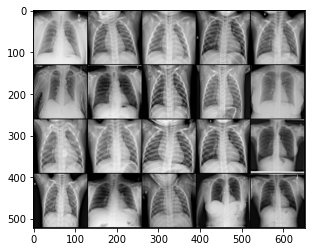

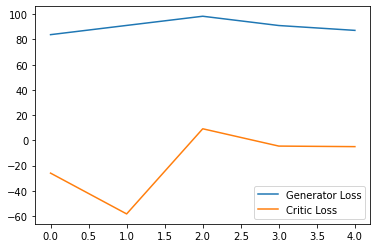

Saving fake_images-1677.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 15, step 120: Generator loss: 83.65554351806641, critic loss: -5.669230934381486


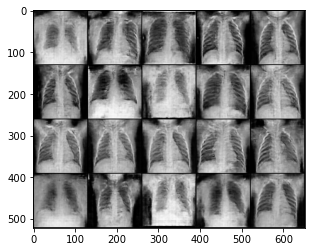

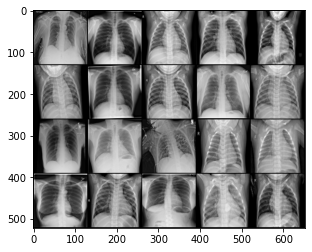

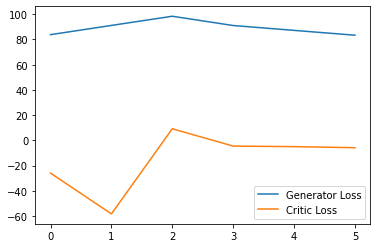

Epoch 15, step 125: Generator loss: 80.15865631103516, critic loss: -4.773194029331207


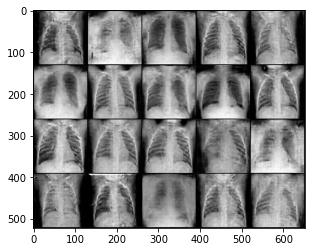

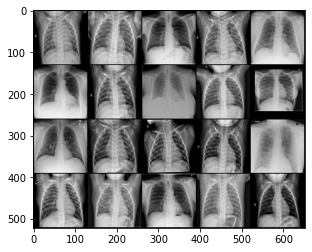

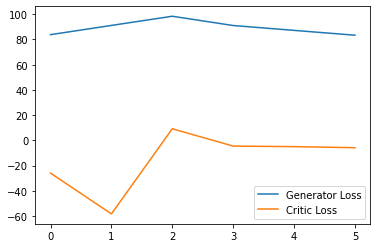

Saving fake_images-1678.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 16, step 130: Generator loss: 77.47882385253907, critic loss: -7.7978688621521


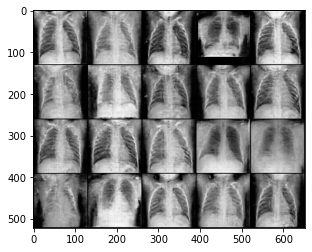

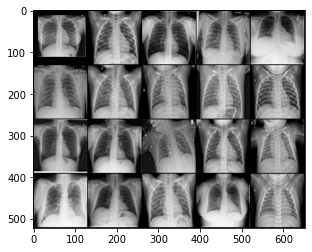

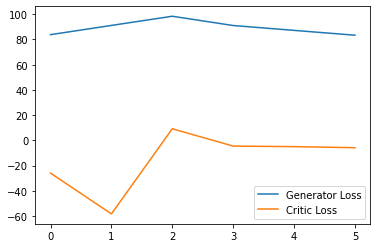

Epoch 16, step 135: Generator loss: 78.79212036132813, critic loss: -5.3096148920059205


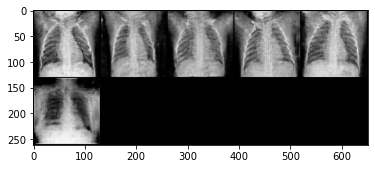

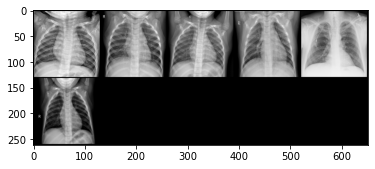

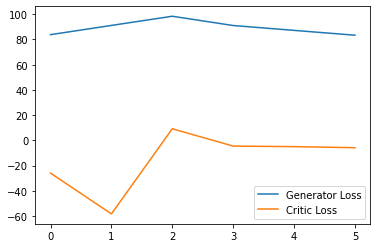

Saving fake_images-1679.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 17, step 140: Generator loss: 78.16363830566407, critic loss: -7.29194634437561


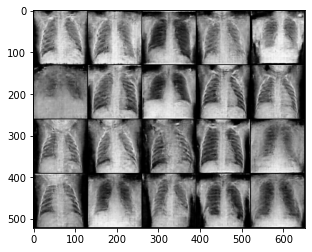

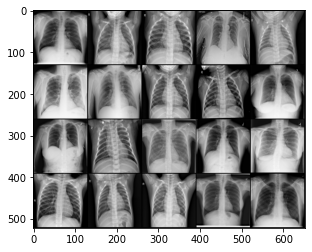

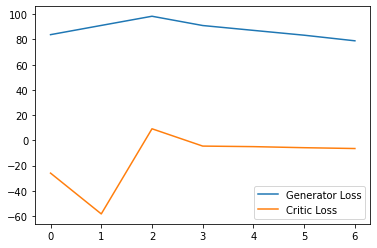

Saving fake_images-1680.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 18, step 145: Generator loss: 76.90664672851562, critic loss: -6.64116457939148


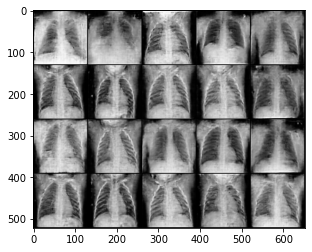

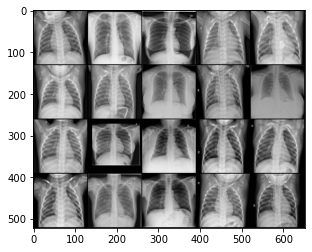

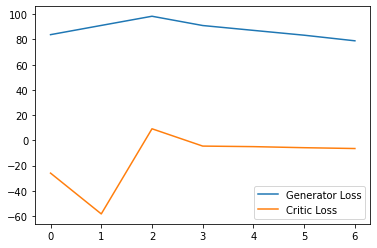

Epoch 18, step 150: Generator loss: 75.89259185791016, critic loss: -7.6530477142333995


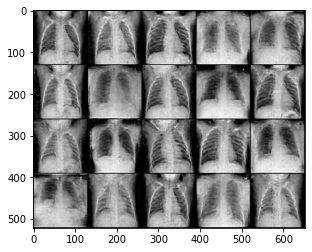

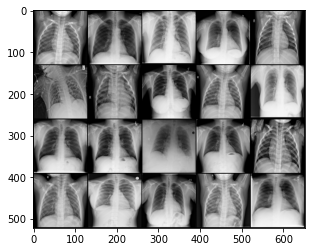

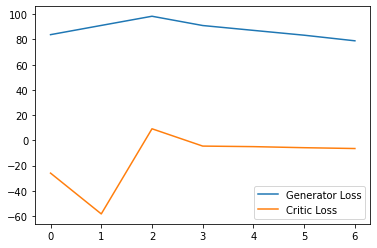

Saving fake_images-1681.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 19, step 155: Generator loss: 76.84849853515625, critic loss: -8.301665754318238


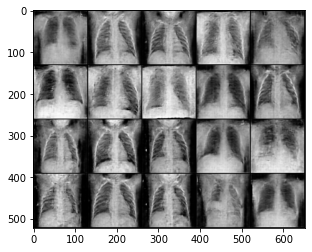

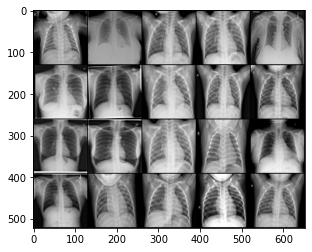

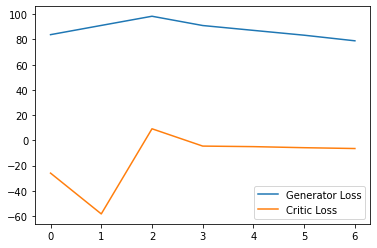

Saving fake_images-1682.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 20, step 160: Generator loss: 75.0721939086914, critic loss: -7.606394309997559


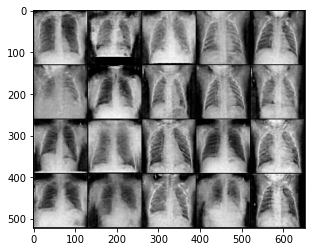

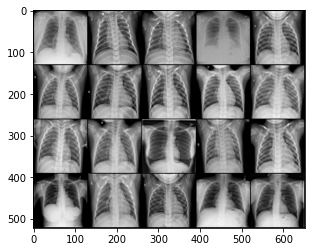

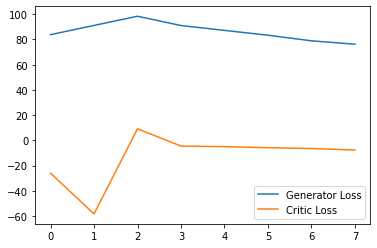

Epoch 20, step 165: Generator loss: 75.43093719482422, critic loss: -8.878557891845702


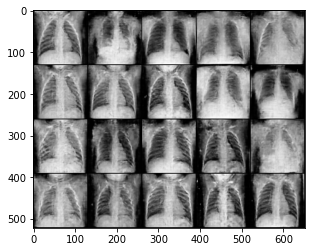

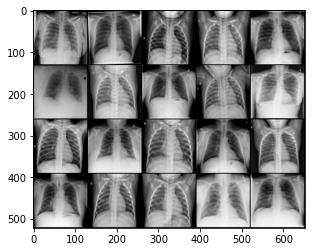

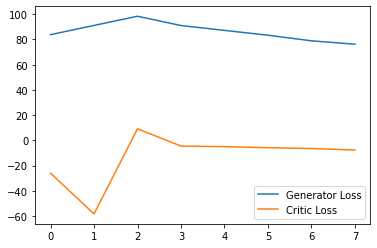

Saving fake_images-1683.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 21, step 170: Generator loss: 71.1556884765625, critic loss: -10.508308563232422


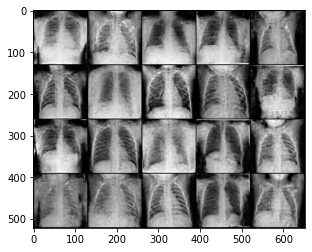

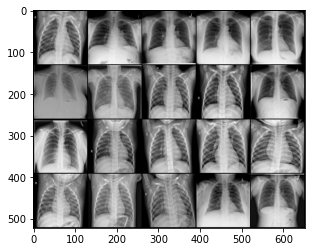

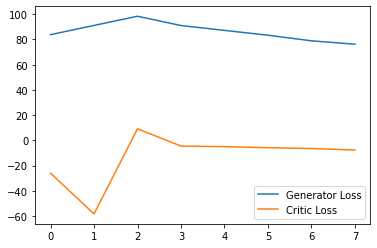

Epoch 21, step 175: Generator loss: 73.82569580078125, critic loss: -7.715987920761108


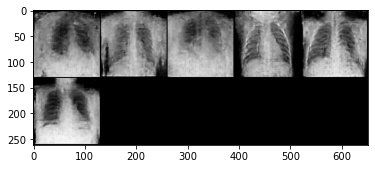

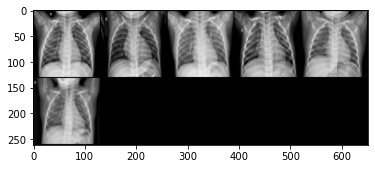

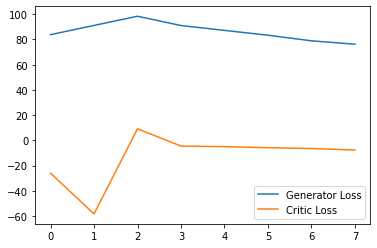

Saving fake_images-1684.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 22, step 180: Generator loss: 77.38057098388671, critic loss: -10.111736202239992


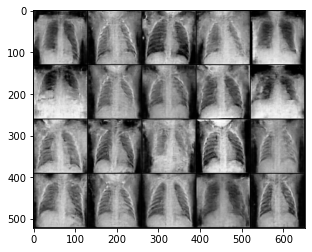

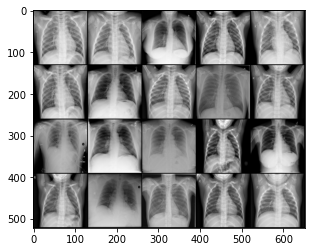

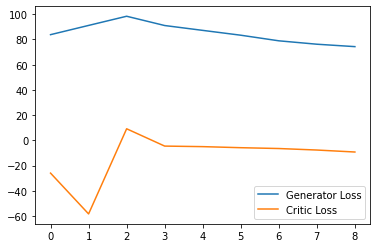

Saving fake_images-1685.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 23, step 185: Generator loss: 72.4527801513672, critic loss: -10.36008162498474


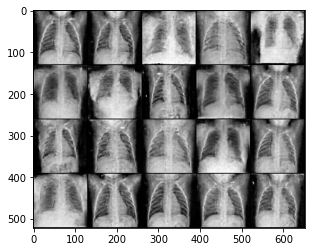

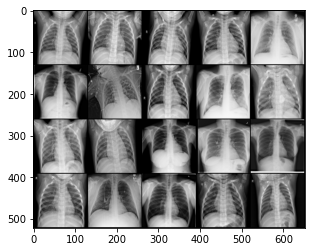

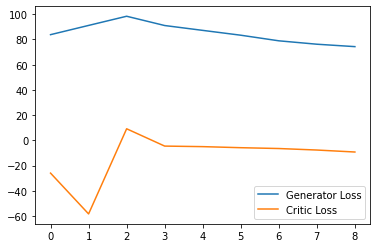

Epoch 23, step 190: Generator loss: 70.60926361083985, critic loss: -10.455741939544676


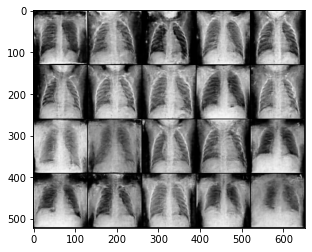

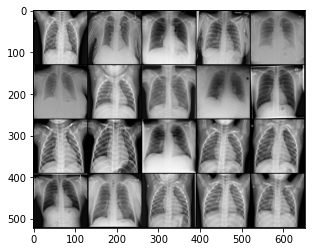

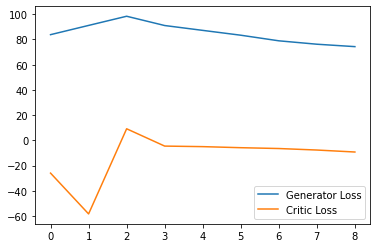

Saving fake_images-1686.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 24, step 195: Generator loss: 72.14832458496093, critic loss: -12.576109313964844


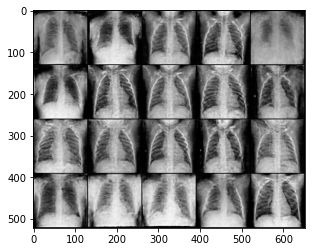

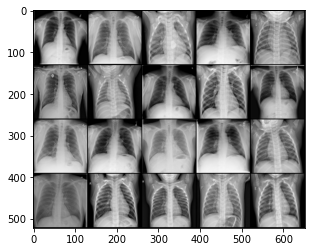

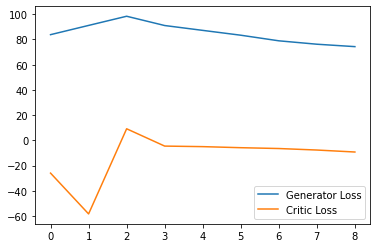

Saving fake_images-1687.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 25, step 200: Generator loss: 70.17863616943359, critic loss: -10.594577178955078


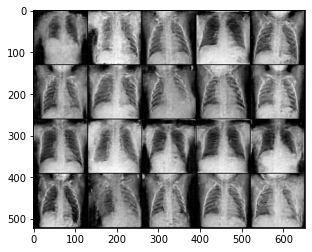

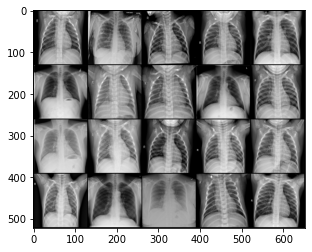

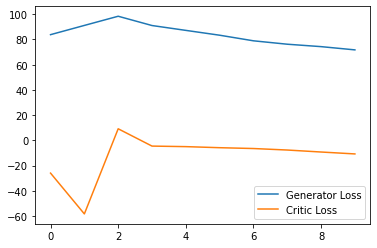

Epoch 25, step 205: Generator loss: 69.8875961303711, critic loss: -12.779725227355957


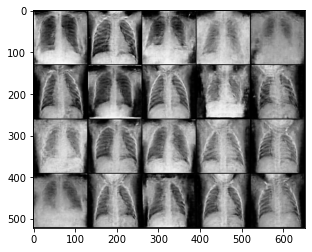

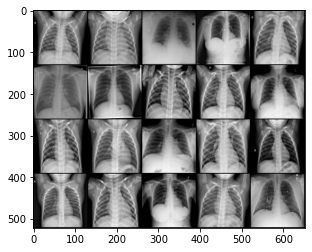

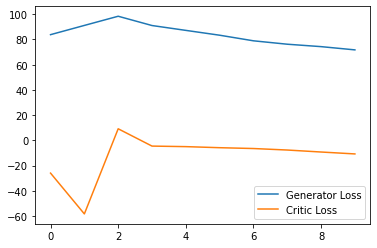

Saving fake_images-1688.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 26, step 210: Generator loss: 71.22947540283204, critic loss: -12.54066234588623


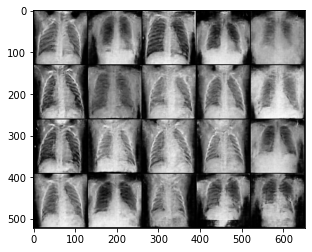

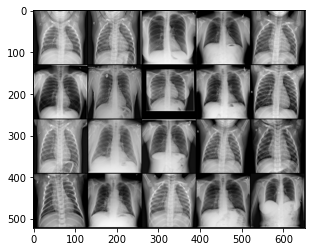

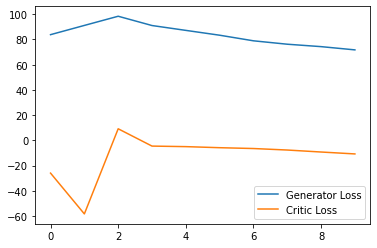

Epoch 26, step 215: Generator loss: 70.29363098144532, critic loss: -14.280985488891602


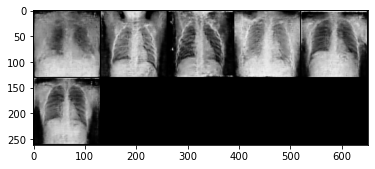

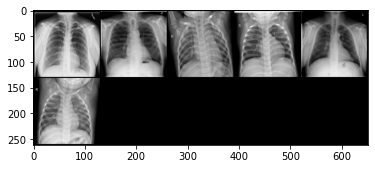

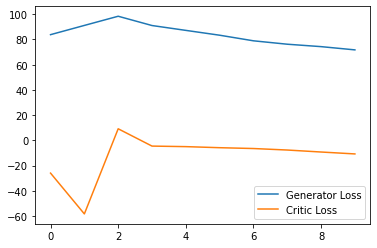

Saving fake_images-1689.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 27, step 220: Generator loss: 70.24056701660156, critic loss: -13.33329345703125


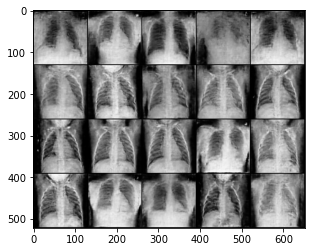

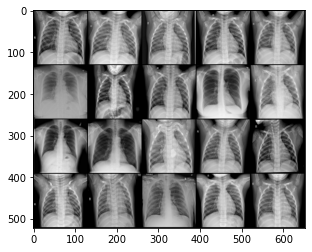

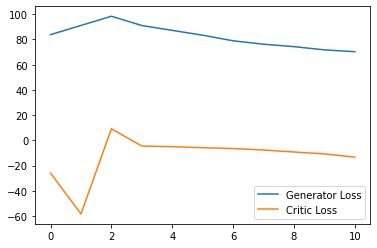

Saving fake_images-1690.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 28, step 225: Generator loss: 72.06582336425781, critic loss: -14.630527343749998


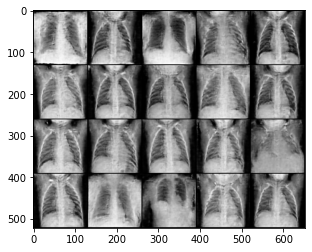

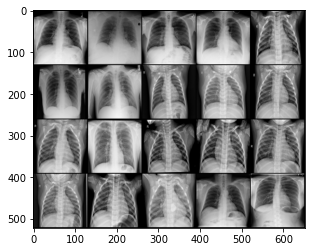

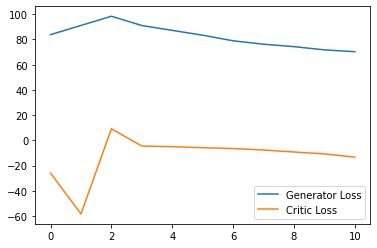

Epoch 28, step 230: Generator loss: 70.61640777587891, critic loss: -13.996274795532226


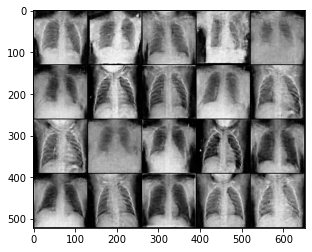

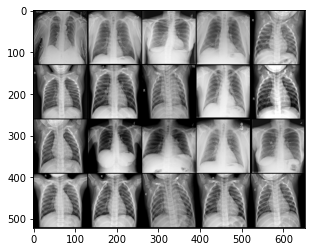

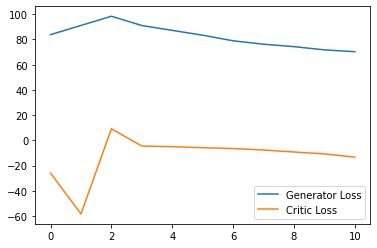

Saving fake_images-1691.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 29, step 235: Generator loss: 72.10746612548829, critic loss: -16.552526397705076


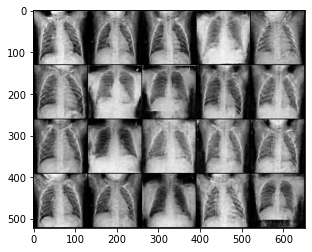

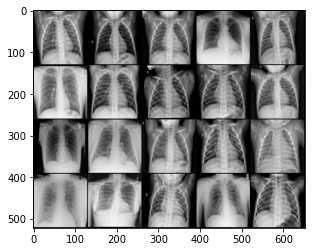

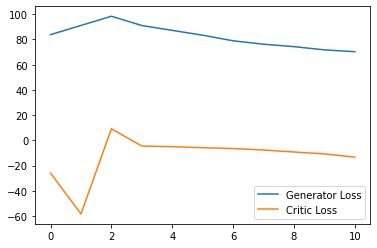

Saving fake_images-1692.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 30, step 240: Generator loss: 70.63651275634766, critic loss: -14.445229072570802


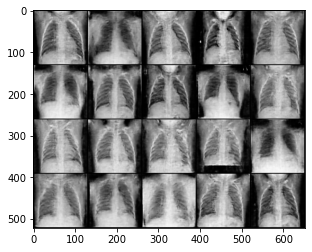

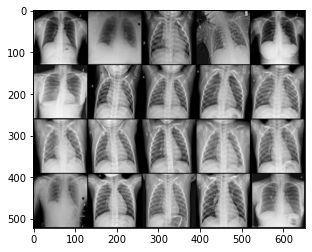

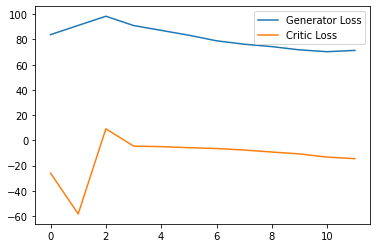

Epoch 30, step 245: Generator loss: 70.32367248535157, critic loss: -15.89640003204346


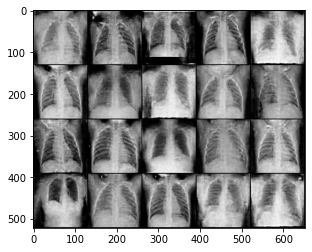

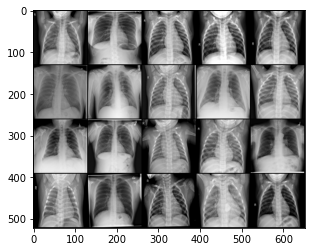

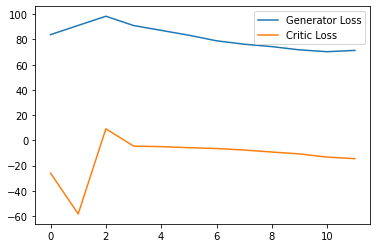

Saving fake_images-1693.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 31, step 250: Generator loss: 72.52388610839844, critic loss: -15.480042343139647


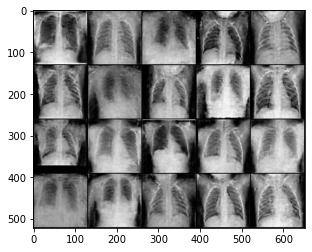

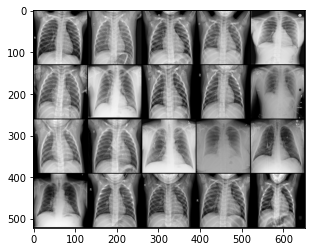

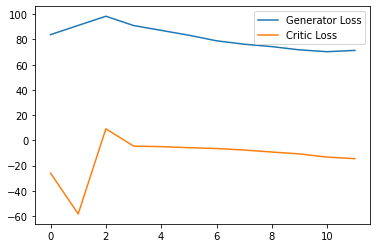

Epoch 31, step 255: Generator loss: 71.54615325927735, critic loss: -18.44878028869629


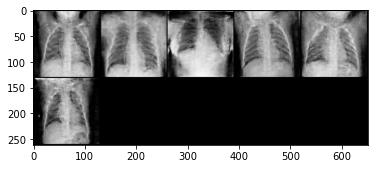

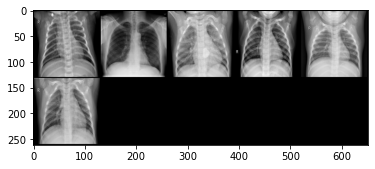

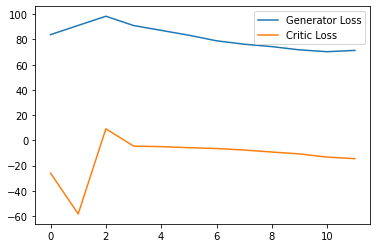

Saving fake_images-1694.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 32, step 260: Generator loss: 70.34225616455078, critic loss: -18.299898414611814


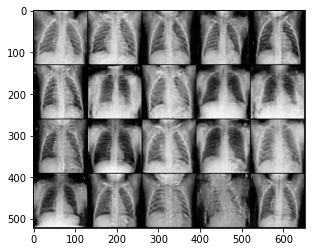

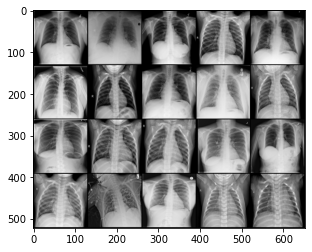

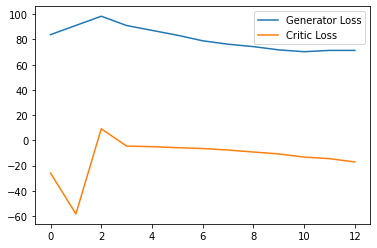

Saving fake_images-1695.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 33, step 265: Generator loss: 73.49335174560547, critic loss: -20.007457160949706


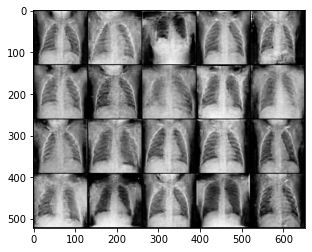

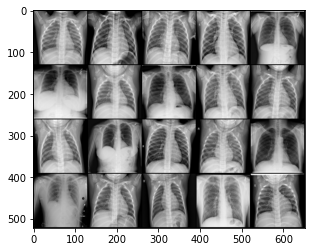

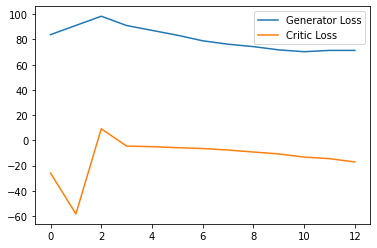

Epoch 33, step 270: Generator loss: 68.44039001464844, critic loss: -19.229877586364744


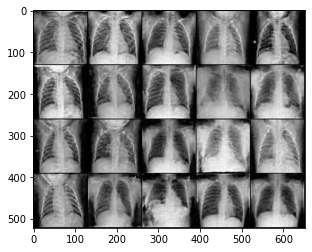

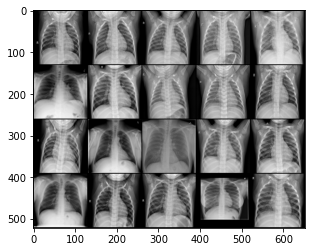

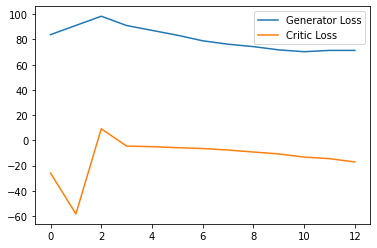

Saving fake_images-1696.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 34, step 275: Generator loss: 69.09657440185546, critic loss: -21.65449867248535


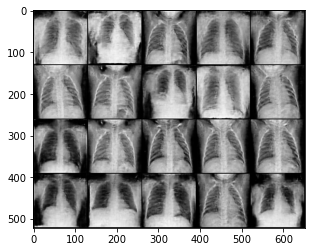

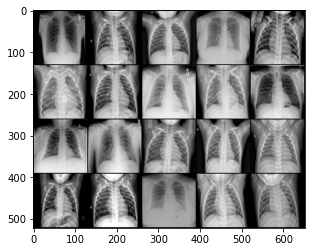

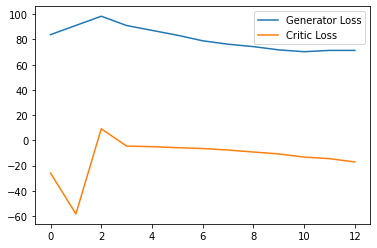

Saving fake_images-1697.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 35, step 280: Generator loss: 73.53930969238282, critic loss: -23.437983703613284


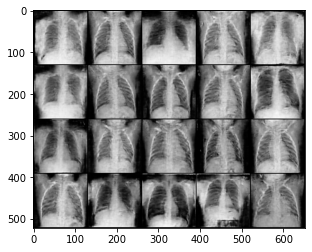

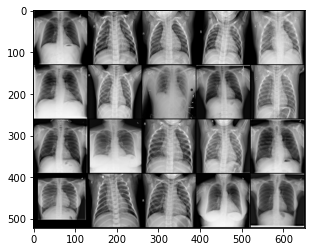

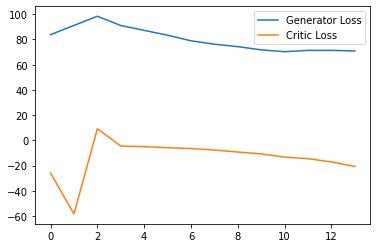

Epoch 35, step 285: Generator loss: 73.51568145751953, critic loss: -22.692636184692383


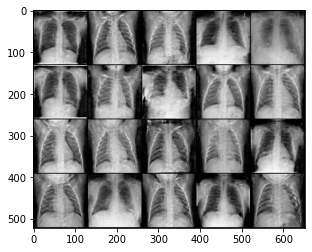

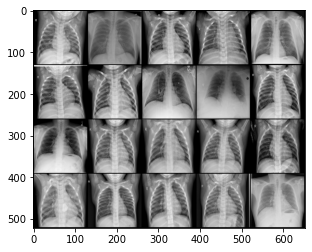

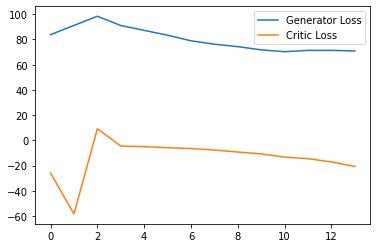

Saving fake_images-1698.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 36, step 290: Generator loss: 75.35333404541015, critic loss: -20.987711677551268


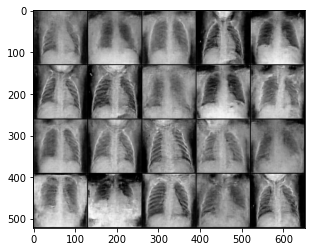

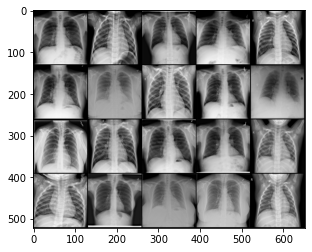

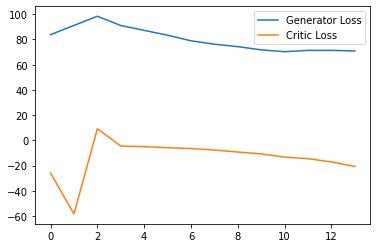

Epoch 36, step 295: Generator loss: 70.51550598144532, critic loss: -26.215551147460936


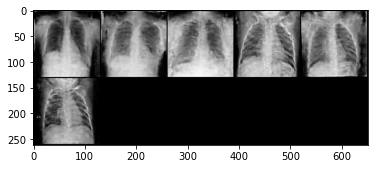

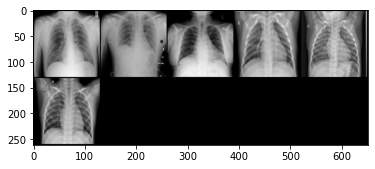

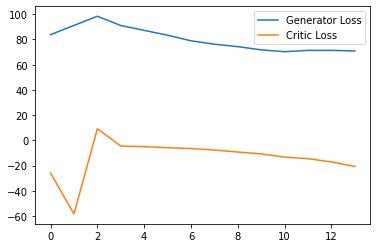

Saving fake_images-1699.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 37, step 300: Generator loss: 76.76960601806641, critic loss: -25.280300521850585


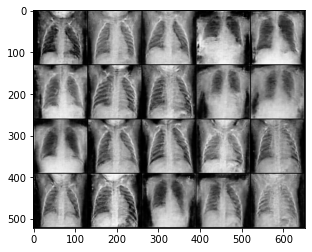

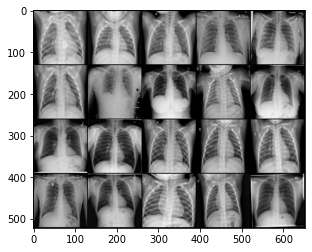

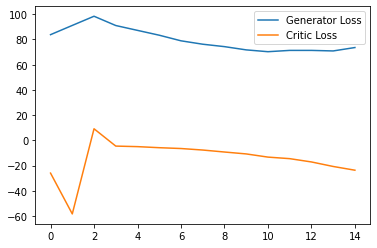

Saving fake_images-1700.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 38, step 305: Generator loss: 75.56266479492187, critic loss: -24.53624786376953


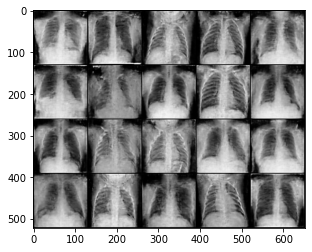

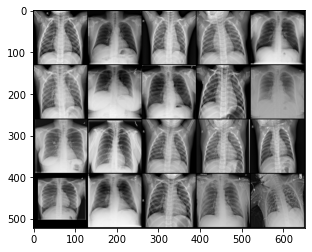

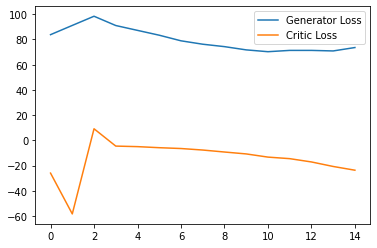

Epoch 38, step 310: Generator loss: 76.14100341796875, critic loss: -28.146238403320307


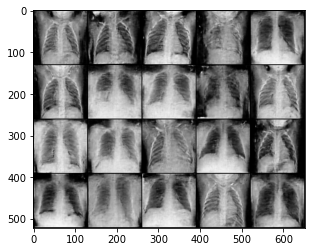

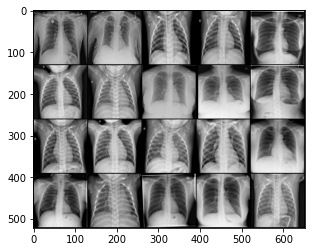

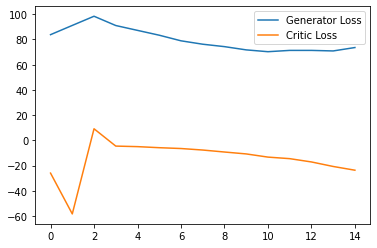

Saving fake_images-1701.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 39, step 315: Generator loss: 78.2220443725586, critic loss: -29.394084358215338


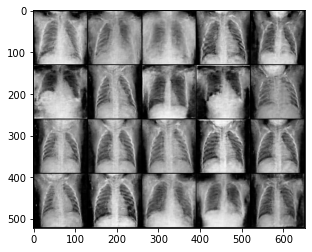

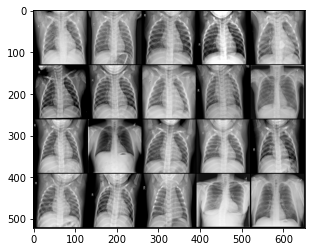

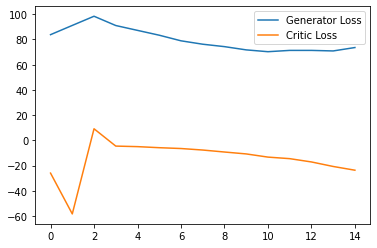

Saving fake_images-1702.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 40, step 320: Generator loss: 77.58932952880859, critic loss: -30.566905479431153


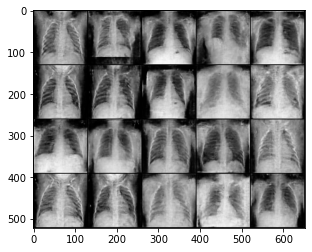

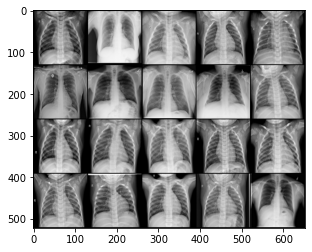

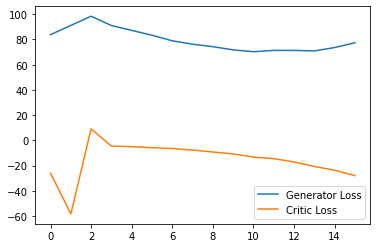

Epoch 40, step 325: Generator loss: 78.98219146728516, critic loss: -34.234621429443365


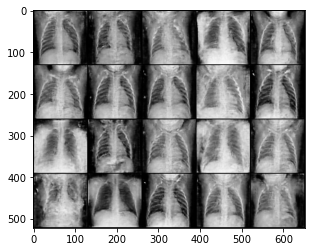

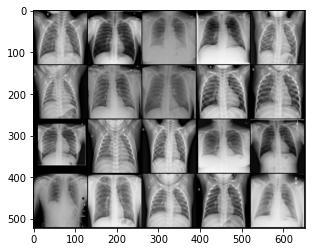

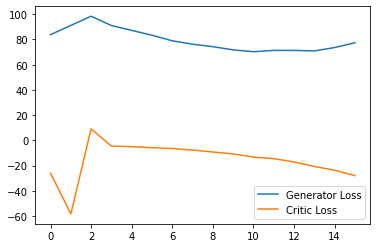

Saving fake_images-1703.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 41, step 330: Generator loss: 82.21381988525391, critic loss: -39.74041114807129


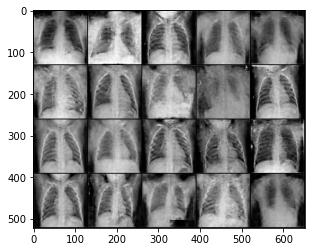

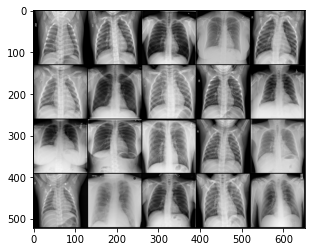

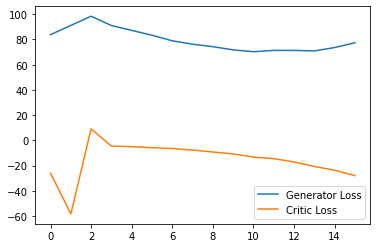

Epoch 41, step 335: Generator loss: 80.45131988525391, critic loss: -38.87465789794921


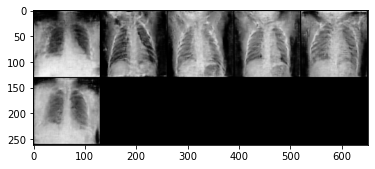

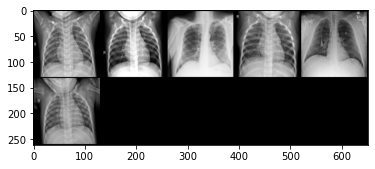

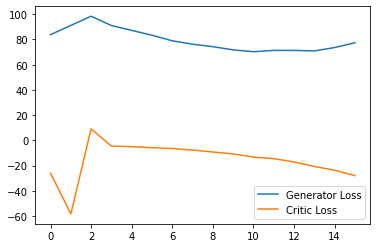

Saving fake_images-1704.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 42, step 340: Generator loss: 83.52271423339843, critic loss: -38.862040710449214


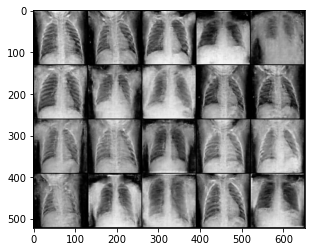

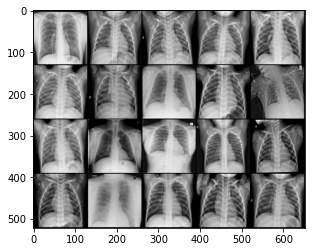

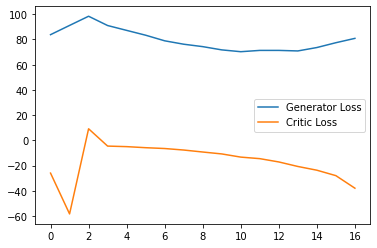

Saving fake_images-1705.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 43, step 345: Generator loss: 81.38859252929687, critic loss: -50.53380767822266


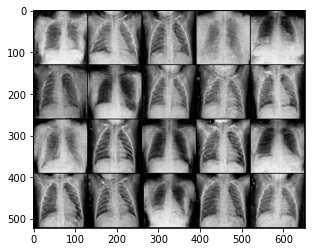

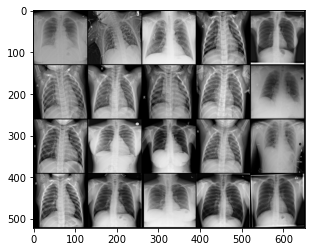

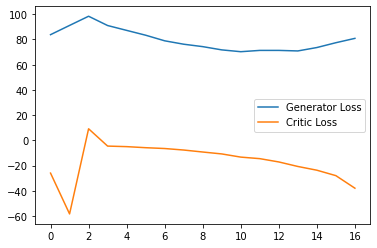

Epoch 43, step 350: Generator loss: 91.59410247802734, critic loss: -53.10280006408691


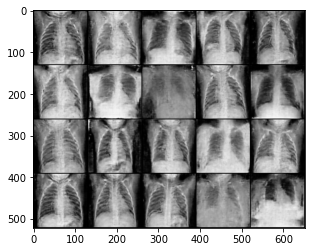

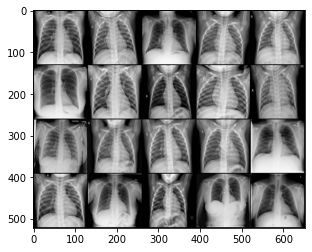

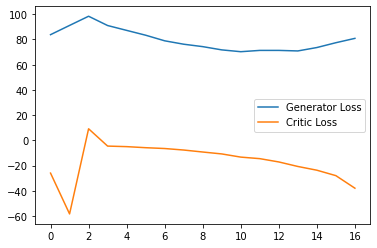

Saving fake_images-1706.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 44, step 355: Generator loss: 81.08307800292968, critic loss: -24.008331985473635


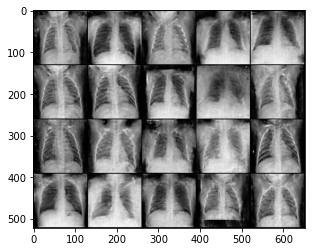

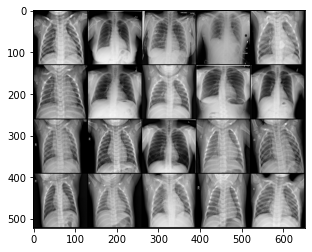

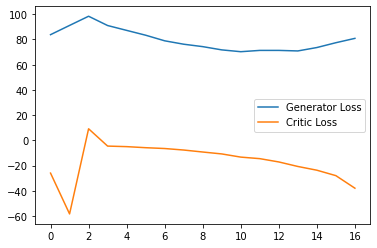

Saving fake_images-1707.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 45, step 360: Generator loss: 73.89412918090821, critic loss: -53.875650787353514


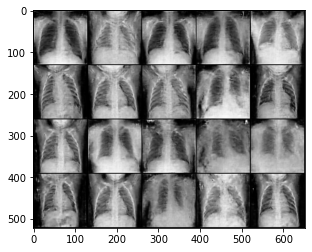

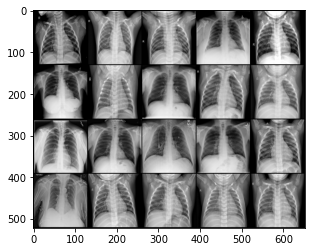

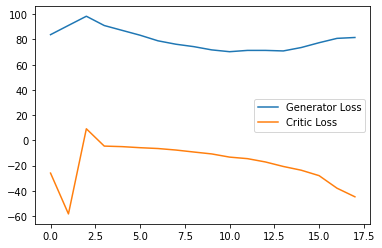

Epoch 45, step 365: Generator loss: 79.38926010131836, critic loss: -42.054709854125974


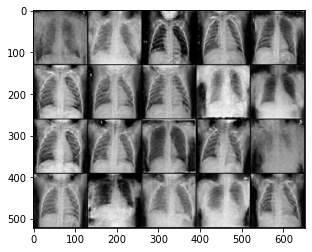

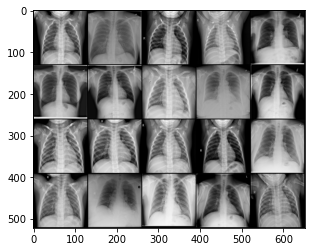

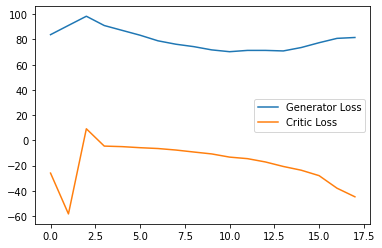

Saving fake_images-1708.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 46, step 370: Generator loss: 87.84381561279297, critic loss: -20.406222381591796


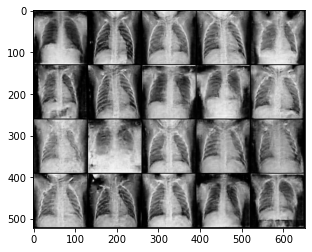

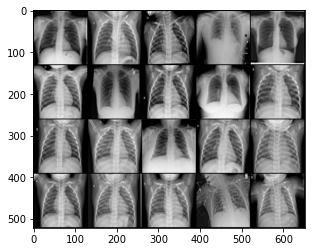

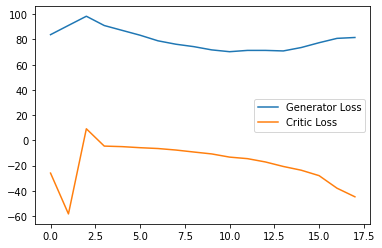

Epoch 46, step 375: Generator loss: 89.18189544677735, critic loss: -25.373720932006837


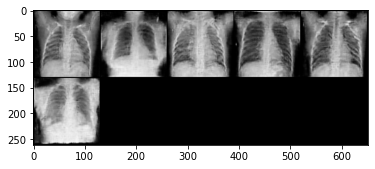

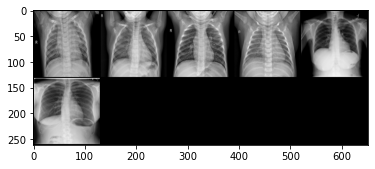

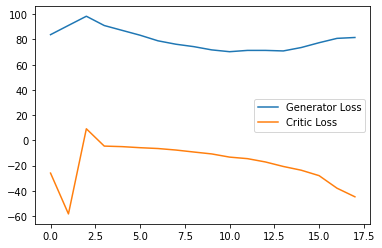

Saving fake_images-1709.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 47, step 380: Generator loss: 82.29591217041016, critic loss: -36.86747871398926


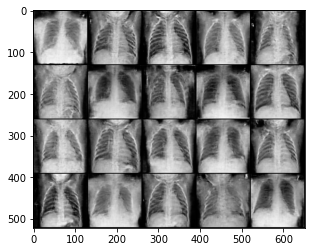

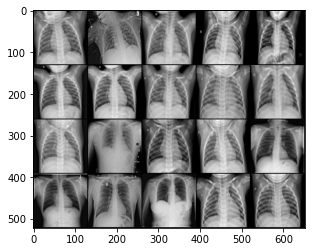

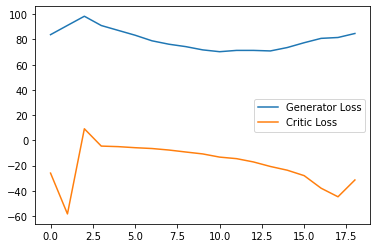

Saving fake_images-1710.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 48, step 385: Generator loss: 87.4066665649414, critic loss: -62.13924346923828


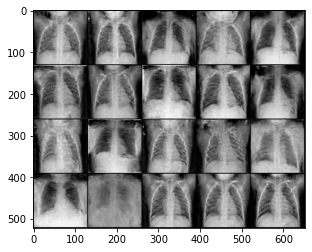

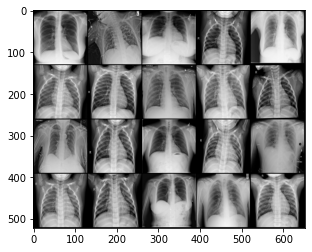

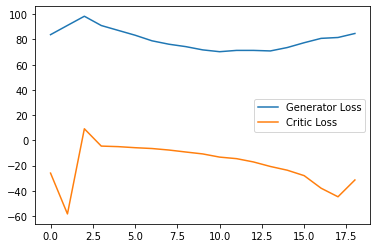

Epoch 48, step 390: Generator loss: 95.21669921875, critic loss: -71.65437705993652


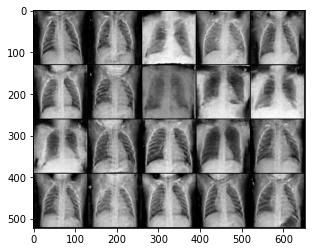

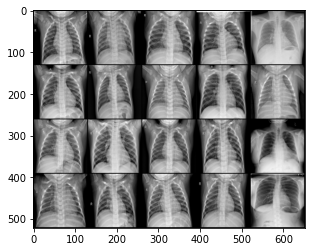

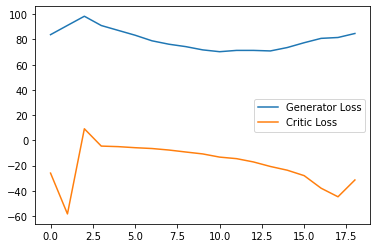

Saving fake_images-1711.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 49, step 395: Generator loss: 101.64522399902344, critic loss: -36.89472866058348


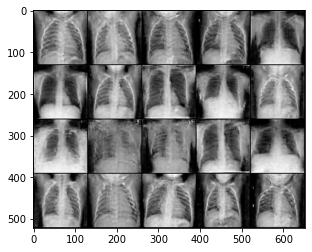

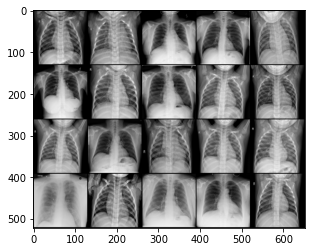

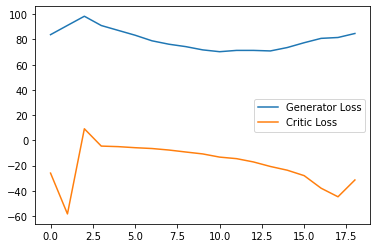

Saving fake_images-1712.png
Wall time: 8min 9s


In [33]:
%%time
if epoch_flag == True:
    previous_epochs = previous_epochs
elif epoch_flag == False:
    previous_epochs = 0
    
cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real_images, _ in tqdm(data_loader):
        cur_batch_size = len(real_images)
        real_images = real_images.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real_images)

            epsilon = torch.rand(len(real_images), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real_images, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step >= 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real_images)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
    all_epochs = epoch + 1 + previous_epochs
    if epoch_flag == True:
        save_fake_images(all_epochs)
    elif epoch_flag == False:
        save_fake_images(epoch + 1)
        
    # Saving the model and optimizer
    torch.save({
            'epoch': all_epochs,
            'Gmodel_state_dict': gen.state_dict(),
            'Dmodel_state_dict': crit.state_dict(),
            'G_optimizer':gen_opt.state_dict(),
            'D_optimizer':crit_opt.state_dict()
              
            }, 'WGAN-GP-NORMAL-A-Scheme2(292).pt')       
 

In [84]:
torch.save({
            'epoch': all_epochs,
            'Gmodel_state_dict': gen.state_dict(),
            'Dmodel_state_dict': crit.state_dict(),
            'G_optimizer':gen_opt.state_dict(),
            'D_optimizer':crit_opt.state_dict()
              
            }, 'WGAN-GP-NORMAL-A-Scheme2(292).pt')  

In [ ]:
# To save images from last epoch
"""for epoch in range(epochs):
    if epoch == epochs - 1:"""

In [85]:
print("Number of Epochs after TrainingLoop:",all_epochs)

Number of Epochs after TrainingLoop: 662


In [32]:
checkpoint = torch.load('WGAN-GP-NORMAL-A-Scheme2(292).pt')
gen.load_state_dict(checkpoint['Gmodel_state_dict']) # Load Generator model
crit.load_state_dict(checkpoint['Dmodel_state_dict']) # load Discriminator model
gen_opt.load_state_dict(checkpoint['G_optimizer']) # Load Generator's optimizer
crit_opt.load_state_dict(checkpoint['D_optimizer']) # Load Discriminator's optimizer
previous_epochs = checkpoint['epoch']
epoch_flag = True
print("Number of Epochs after training:",previous_epochs)

Number of Epochs after training: 1662
